In [1]:
import pandas as pd
import numpy as np

In [2]:
PP = pd.read_csv('PP_Segmentado_ABC.csv')
TDC_dept = pd.read_csv('TDC_Dept_Segmentado_ABC.csv')
TDC_visa = pd.read_csv('TDC_Visa_Segmentado_ABC.csv')

#### Se renombran las columnas de M0

In [3]:
rn = {'Saldo_total': 'Saldo_total_M0',
      'Saldo_Mes': 'Saldo_Mes_M0',
      'Utilizacion': 'Utilizacion_M0'}
PP = PP.rename(columns=rn)

In [4]:
PP.columns

Index(['Socio', 'Mob', 'Saldo_total_M0', 'Saldo_Mes_M0', 'Pago_minimo_M0',
       'Utilizacion_M0', 'Pago_M0', 'Limite_credito', 'Genero', 'ESTADO',
       'Saldo_total_M1', 'Saldo_total_M2', 'Saldo_total_M3', 'Saldo_total_M4',
       'Saldo_total_M5', 'Saldo_total_M6', 'Saldo_Mes_M1', 'Saldo_Mes_M2',
       'Saldo_Mes_M3', 'Saldo_Mes_M4', 'Saldo_Mes_M5', 'Saldo_Mes_M6',
       'Pago_minimo_M1', 'Pago_minimo_M2', 'Pago_minimo_M3', 'Pago_minimo_M4',
       'Pago_minimo_M5', 'Pago_minimo_M6', 'Utilizacion_M1', 'Utilizacion_M2',
       'Utilizacion_M3', 'Utilizacion_M4', 'Utilizacion_M5', 'Utilizacion_M6',
       'Pago_M1', 'Pago_M2', 'Pago_M3', 'Pago_M4', 'Pago_M5', 'Pago_M6',
       'Canal_Pago_M1', 'Canal_Pago_M2', 'Canal_Pago_M3', 'Canal_Pago_M4',
       'Canal_Pago_M5', 'Canal_Pago_M6', 'Variable_objetivo',
       'dias_deudados_m6', 'dias_deudados_m5', 'dias_deudados_m4',
       'dias_deudados_m3', 'dias_deudados_m2', 'dias_deudados_m1',
       'dias_deudados_m0', 'Edad', 'Variable_

In [5]:
PP

,Socio,Mob,Saldo_total_M0,Saldo_Mes_M0,Pago_minimo_M0,Utilizacion_M0,Pago_M0,Limite_credito,Genero,ESTADO,...,Edad,Variable_Objetivo_m6,Variable_Objetivo_m5,Variable_Objetivo_m4,Variable_Objetivo_m3,Variable_Objetivo_m2,Variable_Objetivo_m1,L2_Saldo_Mes,L2_Pago,Segmento_ABC
0,BOD,4,68086.86,68086.86,68086.86,15.130413,NaN,4500.0,M,EM,...,56,0,0,0,0,0,0,73701.086634,0.0,A
1,BOD,15,39558.87,39558.87,39558.87,15.823548,NaN,2500.0,M,GRO,...,62,0,0,0,0,0,0,67215.740776,0.0,A
2,GCC,17,36364.76,36364.76,36364.76,3.827869,NaN,9500.0,F,GRO,...,49,0,0,0,0,0,0,62592.930267,0.0,A
3,GCC,17,32796.07,32796.07,32796.07,3.999521,NaN,8200.0,F,GRO,...,59,0,0,0,0,0,0,55957.640182,0.0,A
4,BOD,14,34526.00,33490.35,33490.35,7.192917,NaN,4800.0,M,GRO,...,62,0,0,0,0,0,0,55222.334312,0.0,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
126110,BOD,2,691.01,202.63,202.63,0.072738,692.0,9500.0,F,DF,...,38,0,0,0,0,0,0,229.211467,0.0,C
126111,CYA,62,119.01,119.01,119.01,0.019478,NaN,6110.0,F,GRO,...,30,0,0,0,0,0,0,170.517831,0.0,C
126112,CYA,34,124.61,124.61,124.61,0.062305,125.0,2000.0,M,DF,...,50,0,0,0,0,0,0,124.610000,0.0,C
126113,GCC,9,68.31,68.31,68.31,0.013394,NaN,5100.0,M,GTO,...,31,0,0,0,0,0,0,121.618722,0.0,C


#### Extraer columnas de pago

In [6]:
columns = []
for i in range(6, -1, -1):
    pago_minimo = 'Pago_minimo_M' + str(i)
    pago = 'Pago_M' + str(i)
    saldo_total = 'Saldo_total_M' + str(i)
    #saldo = 'Saldo_Mes_M' + str(i)

    columns.extend([saldo_total, pago_minimo, pago])
PP.loc[:25, columns]

,Saldo_total_M6,Pago_minimo_M6,Pago_M6,Saldo_total_M5,Pago_minimo_M5,Pago_M5,Saldo_total_M4,Pago_minimo_M4,Pago_M4,Saldo_total_M3,...,Pago_M3,Saldo_total_M2,Pago_minimo_M2,Pago_M2,Saldo_total_M1,Pago_minimo_M1,Pago_M1,Saldo_total_M0,Pago_minimo_M0,Pago_M0
0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,48552.78,...,0.0,53912.79,14249.67,0.0,60496.01,23482.94,0.0,68086.86,68086.86,NaN
1,14006.82,11736.49,0.0,16311.17,14248.33,0.0,19262.36,17424.94,0.0,23237.70,...,0.0,28131.38,26805.58,0.0,34526.00,33490.35,0.0,39558.87,39558.87,NaN
2,12709.14,11402.65,0.0,15214.42,15214.42,0.0,17579.28,17579.28,0.0,20677.09,...,0.0,24699.96,24699.96,0.0,29787.90,29787.90,0.0,36364.76,36364.76,NaN
3,11714.12,10754.52,0.0,13369.06,12868.56,0.0,15482.39,15482.39,0.0,18308.57,...,0.0,22026.12,22026.12,0.0,26727.47,26727.47,0.0,32796.07,32796.07,NaN
4,12282.61,9821.13,0.0,14006.82,11736.49,0.0,16311.17,14248.33,0.0,19262.36,...,0.0,23237.70,21645.33,0.0,28131.38,26805.58,0.0,34526.00,33490.35,NaN
5,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,35148.00,...,0.0,39148.15,10377.23,0.0,44057.61,17208.92,0.0,49592.62,49592.62,NaN
6,12482.59,9977.29,0.0,12709.14,11402.65,0.0,15214.42,15214.42,0.0,17579.28,...,0.0,20677.09,20677.09,0.0,24699.96,24699.96,0.0,29787.90,29787.90,NaN
7,10121.97,10121.97,0.0,11708.21,11708.21,0.0,13732.34,13732.34,0.0,16267.03,...,0.0,19601.77,19601.77,0.0,23808.47,23808.47,0.0,29241.85,29241.85,NaN
8,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,...,0.0,NaN,NaN,0.0,36505.07,4861.70,763.0,53735.68,48848.04,1345.0
9,10003.17,8065.94,0.0,11714.12,10754.52,0.0,13369.06,12868.56,0.0,15482.39,...,0.0,18308.57,18308.57,0.0,22026.12,22026.12,0.0,26727.47,26727.47,NaN


## Manejo de clientes activados en $M_i$

Se clasificaron los clientes a partir del mes en el que se activaron para poder hacer un manejo de los NaNs previos al primer registro atribuidos a la inexistencia de la cuenta.

In [7]:
# Diccionario para almacenar los clientes por mes de activación
clientes_por_mes = {f'M{i}': [] for i in range(6, -1, -1)}

for row in PP.index:    
    for i in range(6, -1, -1):
        if not pd.isna(PP.loc[row, f'Saldo_total_M{i}']):
            clientes_por_mes[f'M{i}'].append(row)
            
            # Rellenar los NaNs antes de la activación
            for j in range(i + 1, 7):  # de M(i) a M6
                for var in ['Saldo_total', 'Saldo_Mes', 'Pago', 'Pago_minimo', 'Utilizacion']:
                    col_name = f"{var}_M{j}"
                    PP.loc[row, col_name] = 0
            break # Sale del bucle una vez que se encuentra el primer registro
# Muestra los clientes segmentados por mes de activación
for mes, clientes in clientes_por_mes.items():
    print(f"Clientes activados en {mes}: {clientes}")

Clientes activados en M6: [1, 2, 3, 4, 6, 7, 9, 10, 11, 14, 15, 16, 18, 19, 20, 23, 24, 25, 26, 28, 29, 30, 31, 34, 35, 36, 38, 39, 40, 42, 43, 44, 45, 46, 47, 49, 50, 51, 52, 53, 54, 55, 57, 59, 60, 61, 62, 63, 65, 66, 68, 69, 71, 72, 73, 74, 75, 76, 77, 78, 79, 81, 82, 83, 85, 86, 87, 88, 89, 90, 91, 93, 94, 96, 97, 98, 99, 100, 101, 102, 104, 105, 106, 107, 113, 114, 116, 117, 119, 120, 121, 122, 123, 124, 125, 126, 127, 129, 130, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 143, 144, 145, 146, 147, 149, 150, 152, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 191, 193, 194, 195, 196, 197, 199, 201, 203, 204, 205, 207, 208, 209, 210, 211, 212, 220, 225, 226, 227, 228, 229, 231, 232, 233, 234, 235, 236, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 269, 270, 271, 273, 274, 275, 276, 277, 278, 279, 280, 283, 285, 286, 288, 289, 290, 291, 292, 29

Confirmamos que se hayan clasificado a todos los clientes

In [8]:
suma = sum(len(j) for i,j in clientes_por_mes.items())
suma

126115

Resultado del manejo previo de NaN's:

In [9]:
PP.loc[[1,2,3,5,21,37,12,0,17,103,8,325,989], columns]

,Saldo_total_M6,Pago_minimo_M6,Pago_M6,Saldo_total_M5,Pago_minimo_M5,Pago_M5,Saldo_total_M4,Pago_minimo_M4,Pago_M4,Saldo_total_M3,...,Pago_M3,Saldo_total_M2,Pago_minimo_M2,Pago_M2,Saldo_total_M1,Pago_minimo_M1,Pago_M1,Saldo_total_M0,Pago_minimo_M0,Pago_M0
1,14006.82,11736.49,0.0,16311.17,14248.33,0.0,19262.36,17424.94,0.0,23237.70,...,0.0,28131.38,26805.58,0.0,34526.00,33490.35,0.0,39558.87,39558.87,NaN
2,12709.14,11402.65,0.0,15214.42,15214.42,0.0,17579.28,17579.28,0.0,20677.09,...,0.0,24699.96,24699.96,0.0,29787.90,29787.90,0.0,36364.76,36364.76,NaN
3,11714.12,10754.52,0.0,13369.06,12868.56,0.0,15482.39,15482.39,0.0,18308.57,...,0.0,22026.12,22026.12,0.0,26727.47,26727.47,0.0,32796.07,32796.07,NaN
5,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.0,35148.00,...,0.0,39148.15,10377.23,0.0,44057.61,17208.92,0.0,49592.62,49592.62,NaN
21,0.00,0.00,0.0,8092.26,1526.66,0.0,10759.10,4073.06,2420.0,30478.78,...,3200.0,NaN,NaN,0.0,NaN,NaN,0.0,37358.23,37358.23,NaN
37,0.00,0.00,0.0,13112.56,1703.81,1704.0,21451.13,2926.18,0.0,24092.49,...,3000.0,23799.00,7712.07,0.0,27140.58,12429.97,0.0,30740.25,30740.25,NaN
12,0.00,0.00,0.0,0.00,0.00,0.0,12699.39,12392.67,0.0,15345.04,...,0.0,18790.95,18679.91,0.0,23182.85,23182.85,0.0,26590.84,26590.84,NaN
0,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.0,48552.78,...,0.0,53912.79,14249.67,0.0,60496.01,23482.94,0.0,68086.86,68086.86,NaN
17,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.00,...,0.0,30563.89,3994.59,1006.0,32952.30,7918.01,1006.0,44674.07,38641.35,1595.0
103,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.00,...,0.0,12699.39,12392.67,0.0,15345.04,15131.96,0.0,18790.95,18679.91,NaN


## Registros raros

In [10]:
raros = set()

for row in PP.index:
    for i in range(5, 0, -1):
        saldo_i = f'Saldo_total_M{i}'
        saldo_pre = f'Saldo_total_M{i+1}'
        pago_pre = f'Pago_M{i+1}'

        if (saldo_i in PP.columns and saldo_pre in PP.columns and pago_pre in PP.columns):
            val_saldo_pre = PP.loc[row, saldo_pre]
            val_pago_pre = PP.loc[row, pago_pre]
            val_saldo_i = PP.loc[row, saldo_i]
            
            if pd.isna(val_saldo_i) and not pd.isna(val_saldo_pre) and not pd.isna(val_pago_pre):
                PP.loc[row, saldo_i] = val_saldo_pre - val_pago_pre
                raros.add(row)

In [11]:
cols_pago_min = [col for col in PP.columns if col.startswith('Pago_minimo_M')]
PP[cols_pago_min] = PP[cols_pago_min].fillna(0)
PP['Pago_M0'] = PP['Pago_M0'].fillna(0)


In [12]:
PP.loc[:25, columns]

,Saldo_total_M6,Pago_minimo_M6,Pago_M6,Saldo_total_M5,Pago_minimo_M5,Pago_M5,Saldo_total_M4,Pago_minimo_M4,Pago_M4,Saldo_total_M3,...,Pago_M3,Saldo_total_M2,Pago_minimo_M2,Pago_M2,Saldo_total_M1,Pago_minimo_M1,Pago_M1,Saldo_total_M0,Pago_minimo_M0,Pago_M0
0,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.0,48552.78,...,0.0,53912.79,14249.67,0.0,60496.01,23482.94,0.0,68086.86,68086.86,0.0
1,14006.82,11736.49,0.0,16311.17,14248.33,0.0,19262.36,17424.94,0.0,23237.70,...,0.0,28131.38,26805.58,0.0,34526.00,33490.35,0.0,39558.87,39558.87,0.0
2,12709.14,11402.65,0.0,15214.42,15214.42,0.0,17579.28,17579.28,0.0,20677.09,...,0.0,24699.96,24699.96,0.0,29787.90,29787.90,0.0,36364.76,36364.76,0.0
3,11714.12,10754.52,0.0,13369.06,12868.56,0.0,15482.39,15482.39,0.0,18308.57,...,0.0,22026.12,22026.12,0.0,26727.47,26727.47,0.0,32796.07,32796.07,0.0
4,12282.61,9821.13,0.0,14006.82,11736.49,0.0,16311.17,14248.33,0.0,19262.36,...,0.0,23237.70,21645.33,0.0,28131.38,26805.58,0.0,34526.00,33490.35,0.0
5,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.0,35148.00,...,0.0,39148.15,10377.23,0.0,44057.61,17208.92,0.0,49592.62,49592.62,0.0
6,12482.59,9977.29,0.0,12709.14,11402.65,0.0,15214.42,15214.42,0.0,17579.28,...,0.0,20677.09,20677.09,0.0,24699.96,24699.96,0.0,29787.90,29787.90,0.0
7,10121.97,10121.97,0.0,11708.21,11708.21,0.0,13732.34,13732.34,0.0,16267.03,...,0.0,19601.77,19601.77,0.0,23808.47,23808.47,0.0,29241.85,29241.85,0.0
8,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.00,...,0.0,0.00,0.00,0.0,36505.07,4861.70,763.0,53735.68,48848.04,1345.0
9,10003.17,8065.94,0.0,11714.12,10754.52,0.0,13369.06,12868.56,0.0,15482.39,...,0.0,18308.57,18308.57,0.0,22026.12,22026.12,0.0,26727.47,26727.47,0.0


#### Análisis de cantidad de clientes después de manejo de NANs

In [13]:
len(clientes_por_mes['M6'])

79434

In [14]:
PP.loc[[19], columns]

,Saldo_total_M6,Pago_minimo_M6,Pago_M6,Saldo_total_M5,Pago_minimo_M5,Pago_M5,Saldo_total_M4,Pago_minimo_M4,Pago_M4,Saldo_total_M3,...,Pago_M3,Saldo_total_M2,Pago_minimo_M2,Pago_M2,Saldo_total_M1,Pago_minimo_M1,Pago_M1,Saldo_total_M0,Pago_minimo_M0,Pago_M0
19,18830.4,18830.4,0.0,22373.15,22373.15,1500.0,24802.89,24802.89,10500.0,14302.89,...,0.0,14302.89,0.0,0.0,2379.84,433.27,0.0,3097.55,1410.69,1411.0


## PP filtrado

Se omitieron 17883 clientes para el análisis de Markov

In [15]:
PP_filtrado = PP.drop(clientes_por_mes['M0'])
PP_filtrado.loc[:, columns]

,Saldo_total_M6,Pago_minimo_M6,Pago_M6,Saldo_total_M5,Pago_minimo_M5,Pago_M5,Saldo_total_M4,Pago_minimo_M4,Pago_M4,Saldo_total_M3,...,Pago_M3,Saldo_total_M2,Pago_minimo_M2,Pago_M2,Saldo_total_M1,Pago_minimo_M1,Pago_M1,Saldo_total_M0,Pago_minimo_M0,Pago_M0
0,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.0,48552.78,...,0.0,53912.79,14249.67,0.0,60496.01,23482.94,0.0,68086.86,68086.86,0.0
1,14006.82,11736.49,0.0,16311.17,14248.33,0.0,19262.36,17424.94,0.0,23237.70,...,0.0,28131.38,26805.58,0.0,34526.00,33490.35,0.0,39558.87,39558.87,0.0
2,12709.14,11402.65,0.0,15214.42,15214.42,0.0,17579.28,17579.28,0.0,20677.09,...,0.0,24699.96,24699.96,0.0,29787.90,29787.90,0.0,36364.76,36364.76,0.0
3,11714.12,10754.52,0.0,13369.06,12868.56,0.0,15482.39,15482.39,0.0,18308.57,...,0.0,22026.12,22026.12,0.0,26727.47,26727.47,0.0,32796.07,32796.07,0.0
4,12282.61,9821.13,0.0,14006.82,11736.49,0.0,16311.17,14248.33,0.0,19262.36,...,0.0,23237.70,21645.33,0.0,28131.38,26805.58,0.0,34526.00,33490.35,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
126106,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.00,...,0.0,0.00,0.00,0.0,1219.62,182.37,0.0,1344.65,367.63,400.0
126109,155.92,15.59,0.0,155.92,0.00,0.0,155.92,0.00,0.0,155.92,...,0.0,137.57,3.77,0.0,149.62,79.85,0.0,170.89,170.89,0.0
126110,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.00,...,0.0,0.00,0.00,0.0,625.64,107.14,0.0,691.01,202.63,692.0
126111,108.53,10.85,0.0,108.53,0.00,0.0,108.53,0.00,0.0,108.53,...,0.0,95.81,3.24,0.0,104.15,55.89,0.0,119.01,119.01,0.0


# Markov

## Definición de estados de pago

In [16]:
def clasificar_estado(pago, pago_minimo, saldo_total):

        if saldo_total == 0: # Desactivacion
            return 5
        elif saldo_total - pago <= 1: # Paga la deuda total
            return 4
        elif pago == 0 and saldo_total != 0: # No pagó nada
            return 0
        elif pago < pago_minimo: # Pagó menos del mínimo
            return 1
        elif abs(pago - pago_minimo) <= 10: # Paga el mínimo
            return 2
        elif pago < saldo_total: # Paga más del mínimo pero menos del total
            return 3
        # else:
        #     return -1


## Clasificación de clientes activados en M0

Excluimos del análisis a los clientes con un único registro pues no se pueden hacer predicciones con ellos al no poder hacer una comparación de su comportamiento mes a mes.

Podemos clasificar directamente a los clientes que tienen un pago registrado, aunque la aproximación será muy imprecisa.

In [17]:
clientesM0 = clientes_por_mes['M0']

In [18]:
# Indices de las filas con pago registrado
pago_true = PP.loc[clientesM0, 'Pago_M0'][~pd.isna(PP.loc[clientesM0, 'Pago_M0'])].index
PP.loc[pago_true, columns]

,Saldo_total_M6,Pago_minimo_M6,Pago_M6,Saldo_total_M5,Pago_minimo_M5,Pago_M5,Saldo_total_M4,Pago_minimo_M4,Pago_M4,Saldo_total_M3,...,Pago_M3,Saldo_total_M2,Pago_minimo_M2,Pago_M2,Saldo_total_M1,Pago_minimo_M1,Pago_M1,Saldo_total_M0,Pago_minimo_M0,Pago_M0
325,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,22077.50,22077.50,0.0
957,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,19587.85,19587.85,15200.0
989,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,19464.97,19464.97,0.0
1075,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,19266.38,19266.38,0.0
1681,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,18089.81,18089.81,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
126066,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,614.50,614.50,620.0
126107,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,354.83,0.00,690.0
126108,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,321.65,321.65,645.0
126112,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,124.61,124.61,125.0


Los clientes sin pago registrado (NANs) se considerarán como que no pagaron

In [19]:
# Indices de las filas sin pago registrado
pago_false = PP.loc[clientesM0][PP.loc[clientesM0, 'Pago_M0'].isna()].index
PP.loc[pago_false, columns]

,Saldo_total_M6,Pago_minimo_M6,Pago_M6,Saldo_total_M5,Pago_minimo_M5,Pago_M5,Saldo_total_M4,Pago_minimo_M4,Pago_M4,Saldo_total_M3,...,Pago_M3,Saldo_total_M2,Pago_minimo_M2,Pago_M2,Saldo_total_M1,Pago_minimo_M1,Pago_M1,Saldo_total_M0,Pago_minimo_M0,Pago_M0


In [20]:
transiciones_por_cliente = {}
clusters = {state: [] for state in range(0, 6)}

for cliente in clientesM0:
    pago_minimo = PP.loc[cliente, 'Pago_minimo_M0']
    pago = PP.loc[cliente, 'Pago_M0']
    saldo_total = PP.loc[cliente, f'Saldo_total_M0']

    estado = clasificar_estado(pago, pago_minimo, saldo_total)
    clusters[estado].append(cliente)



## Traducción de estados y conteo de transiciones

del clientes_por_mes['M0']

In [ ]:
espacio_estados = list(range(0,6)) + [-1]
probabilidades_por_cliente = {}

for mes, clientes in clientes_por_mes.items():
    mes_activacion = int(mes[1:]) # Extrae el numero del mes de activacion: 'M6' -> 6

    for row in clientes:
        estados = [] # Almacena los estados del cliente
        matriz_transicion = pd.DataFrame(0, index = espacio_estados, columns = espacio_estados)

        for i in range(mes_activacion, -1, -1):
            pago_minimo = PP.loc[row, 'Pago_minimo_M' + str(i)]
            pago = PP.loc[row, 'Pago_M' + str(i)]
            saldo_total = PP.loc[row, f'Saldo_total_M{i}']

            # Clasificar el estado 
            estado = clasificar_estado(pago, pago_minimo, saldo_total)
            estados.append(estado)
            
        # Contar las transiciones entre estados consecutivos
        # zip(estados[:-1], estados[1:]) genera los pares: (0, 1), (1, 2), (2, 3)
        for e1, e2 in zip(estados[:0], estados[1:]):
            matriz_transicion.loc[e1, e2] += 1
        
        matriz_probabilidades = matriz_transicion.div(matriz_transicion.sum(axis=1), axis=0).fillna(0)
        
        # Almacenar en el diccionario
        probabilidades_por_cliente[row] = matriz_probabilidades
        transiciones_por_cliente[row] = estados

        print(row, estados)

1 [0, 0, 0, 0, 0, 0, 0]
2 [0, 0, 0, 0, 0, 0, 0]
3 [0, 0, 0, 0, 0, 0, 0]
4 [0, 0, 0, 0, 0, 0, 0]
6 [0, 0, 0, 0, 0, 0, 0]
7 [0, 0, 0, 0, 0, 0, 0]
9 [0, 0, 0, 0, 0, 0, 0]
10 [0, 0, 0, 0, 0, 0, 0]
11 [0, 0, 0, 0, 0, 0, 0]
14 [0, 0, 0, 0, 0, 0, 0]
15 [0, 0, 0, 0, 0, 0, 0]
16 [0, 0, 0, 0, 0, 0, 0]
18 [0, 0, 0, 0, 0, 0, 0]
19 [0, 1, 1, 0, 0, 0, 2]
20 [0, 0, 0, 0, 0, 0, 0]
23 [0, 1, 0, 0, 1, 0, 0]
24 [0, 0, 0, 0, 0, 0, 0]
25 [1, 0, 0, 1, 0, 0, 0]
26 [0, 0, 0, 0, 0, 0, 0]
28 [0, 0, 0, 0, 0, 0, 0]
29 [2, 3, 2, 0, 0, 0, 0]
30 [0, 0, 0, 0, 0, 0, 0]
31 [0, 0, 0, 0, 0, 0, 0]
34 [0, 0, 0, 0, 0, 0, 0]
35 [0, 0, 0, 0, 0, 0, 0]
36 [2, 2, 2, 0, 0, 0, 0]
38 [0, 0, 1, 0, 0, 0, 0]
39 [2, 2, 2, 0, 0, 0, 0]
40 [0, 0, 0, 0, 0, 0, 0]
42 [0, 0, 0, 0, 0, 0, 0]
43 [0, 0, 0, 0, 0, 0, 0]
44 [0, 0, 0, 0, 0, 0, 0]
45 [0, 0, 0, 0, 0, 0, 0]
46 [0, 0, 0, 0, 0, 0, 0]
47 [0, 0, 0, 0, 0, 0, 0]
49 [2, 2, 2, 0, 0, 0, 0]
50 [1, 3, 0, 1, 1, 1, 1]
51 [0, 0, 0, 0, 0, 0, 0]
52 [0, 0, 0, 0, 0, 0, 0]
53 [0, 0, 0, 0, 0, 0, 0]
54 [2, 

In [22]:
probabilidades_por_cliente

{1:       0    1    2    3    4    5   -1
  0  1.0  0.0  0.0  0.0  0.0  0.0  0.0
  1  0.0  0.0  0.0  0.0  0.0  0.0  0.0
  2  0.0  0.0  0.0  0.0  0.0  0.0  0.0
  3  0.0  0.0  0.0  0.0  0.0  0.0  0.0
  4  0.0  0.0  0.0  0.0  0.0  0.0  0.0
  5  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 -1  0.0  0.0  0.0  0.0  0.0  0.0  0.0,
 2:       0    1    2    3    4    5   -1
  0  1.0  0.0  0.0  0.0  0.0  0.0  0.0
  1  0.0  0.0  0.0  0.0  0.0  0.0  0.0
  2  0.0  0.0  0.0  0.0  0.0  0.0  0.0
  3  0.0  0.0  0.0  0.0  0.0  0.0  0.0
  4  0.0  0.0  0.0  0.0  0.0  0.0  0.0
  5  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 -1  0.0  0.0  0.0  0.0  0.0  0.0  0.0,
 3:       0    1    2    3    4    5   -1
  0  1.0  0.0  0.0  0.0  0.0  0.0  0.0
  1  0.0  0.0  0.0  0.0  0.0  0.0  0.0
  2  0.0  0.0  0.0  0.0  0.0  0.0  0.0
  3  0.0  0.0  0.0  0.0  0.0  0.0  0.0
  4  0.0  0.0  0.0  0.0  0.0  0.0  0.0
  5  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 -1  0.0  0.0  0.0  0.0  0.0  0.0  0.0,
 4:       0    1    2    3    4    5   -1
  0  1.0  

## Predicción del estado siguiente de forma determinista (probar forma estocástica)

***Repensar qué hacer con los "estados absorbentes"

In [23]:
a = 0

for cliente, estados in transiciones_por_cliente.items():
    estado_actual = estados[-1]  # Último estado registrado del cliente
    probs = probabilidades_por_cliente[cliente]  # Matriz de probabilidades del cliente

    # Verificar si la fila correspondiente al estado actual tiene probabilidades válidas
    if probs.loc[estado_actual].sum() == 0:
        # probs.loc[estado, estado] = 1
        estado_siguiente = estado_actual
        a += 1
        print(f"El cliente {cliente} tiene una fila de probabilidades vacía para el estado {estado_actual}.")
        clusters[estado_actual].append(cliente)

        continue  # Saltar este cliente

    # Obtener el estado siguiente más probable
    estado_siguiente = probs.loc[estado_actual].idxmax()
    print(f"El siguiente estado más probable desde {estado_actual} para el cliente {cliente} es {estado_siguiente}")

    clusters[estado_actual].append(cliente)


El siguiente estado más probable desde 0 para el cliente 1 es 0
El siguiente estado más probable desde 0 para el cliente 2 es 0
El siguiente estado más probable desde 0 para el cliente 3 es 0
El siguiente estado más probable desde 0 para el cliente 4 es 0
El siguiente estado más probable desde 0 para el cliente 6 es 0
El siguiente estado más probable desde 0 para el cliente 7 es 0
El siguiente estado más probable desde 0 para el cliente 9 es 0
El siguiente estado más probable desde 0 para el cliente 10 es 0
El siguiente estado más probable desde 0 para el cliente 11 es 0
El siguiente estado más probable desde 0 para el cliente 14 es 0
El siguiente estado más probable desde 0 para el cliente 15 es 0
El siguiente estado más probable desde 0 para el cliente 16 es 0
El siguiente estado más probable desde 0 para el cliente 18 es 0
El cliente 19 tiene una fila de probabilidades vacía para el estado 2.
El siguiente estado más probable desde 0 para el cliente 20 es 0
El siguiente estado más pr

'a' son los clientes que caen a un estado donde toda la fila es 0

In [24]:
a

22792

In [25]:
# Obtener la longitud de las listas por clave
longitudes = {key: len(value)/125386 for key, value in clusters.items()}
print(longitudes)

{0: 0.6490437528910724, 1: 0.13433716682883257, 2: 0.11432695835260714, 3: 0.05818831448487072, 4: 0.0557079737769767, 5: 2.3926116153318552e-05}


del clusters[-1]

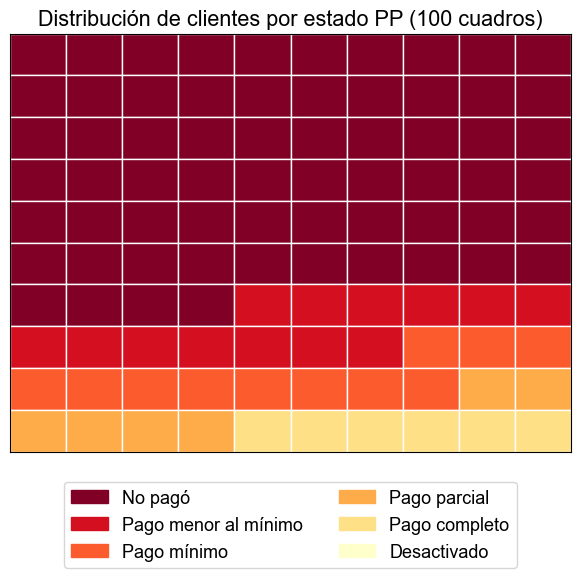

In [26]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches

# 1. Tus datos de entrada
# tamano_clusters es una Serie donde el índice es el estado (0–5)
# y el valor es el número de clientes en cada clúster
# estado_labels mapea cada estado a su etiqueta
tamano_clusters = pd.Series({estado: len(clientes)
                             for estado, clientes in clusters.items()})
tamano_clusters = tamano_clusters.sort_index()

estado_labels = {
    0: "No pagó",
    1: "Pago menor al mínimo",
    2: "Pago mínimo",
    3: "Pago parcial",
    4: "Pago completo",
    5: "Desactivado",
}

# 2. Calculamos cuántos cuadrados (de 100) corresponden a cada estado
total = tamano_clusters.sum()
cuadros = (tamano_clusters / total * 100).round().astype(int)

# Ajuste fino: asegurarnos de que la suma sea 100
diferencia = 100 - cuadros.sum()
if diferencia != 0:
    # sumarlo/restarlo al estado con mayor valor
    idx_max = cuadros.idxmax()
    cuadros[idx_max] += diferencia

# 3. Creamos la matriz 10×10
waffle = []
for estado, n in cuadros.items():
    waffle += [estado] * n
# en caso de sobrante (no debería pasar tras el ajuste), rellenar con None
waffle += [None] * (100 - len(waffle))
waffle = np.array(waffle).reshape((10, 10))

# 4. Dibujamos
fig, ax = plt.subplots(figsize=(6, 6))

# Elegimos un colormap y extraemos un color por estado
#cmap = plt.get_cmap('tab10')
#colors = {estado: cmap(i) for i, estado in enumerate(tamano_clusters.index)}

n = len(tamano_clusters)
cmap = plt.get_cmap('YlOrRd_r')
colors = {
    estado: cmap(i / (n - 1))
    for i, estado in enumerate(tamano_clusters.index)
}

plt.rcParams['font.family'] = 'sans-serif'  # Cambia a la fuente deseada
plt.rcParams['font.sans-serif'] = ['Roboto', 'Arial']
plt.rcParams['font.size'] = 13
plt.rcParams['font.weight'] = 'medium'

# Dibujar cada cuadrado
for i in range(10):
    for j in range(10):
        estado = waffle[i, j]
        color = colors.get(estado, "#f0f0f0")  # gris claro para None
        square = mpatches.Rectangle((j, 9 - i), 1, 1,
                                    facecolor=color, edgecolor='white')
        ax.add_patch(square)

ax.set_xticks([])
ax.set_yticks([])
ax.set_xlim(0, 10)
ax.set_ylim(0, 10)
ax.set_title("Distribución de clientes por estado PP (100 cuadros)")

# 5. Leyenda
patches = [mpatches.Patch(color=colors[est], label=estado_labels[est])
           for est in tamano_clusters.index]
ax.legend(handles=patches, loc='upper center',
          ncol=2, bbox_to_anchor=(0.5, -0.05))

plt.tight_layout()
plt.show()


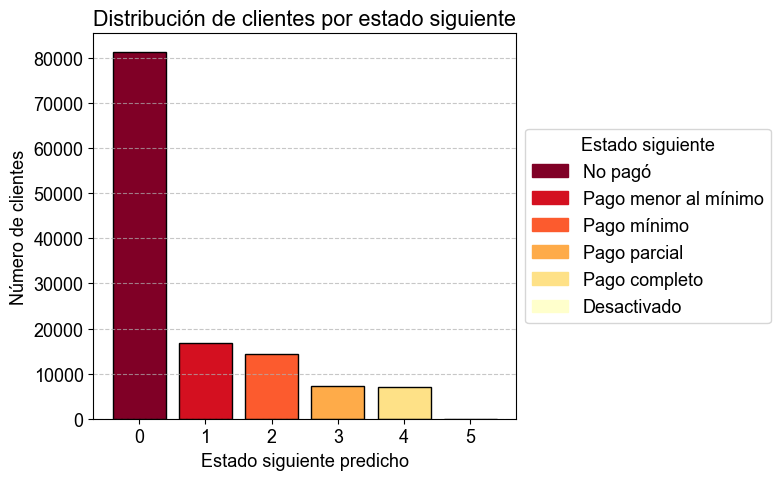

In [27]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd

# Convertimos los tamaños a una Serie
tamano_clusters = pd.Series({estado: len(clientes)
                             for estado, clientes in clusters.items()})
tamano_clusters = tamano_clusters.sort_index()  # Ordenar por estado

# Diccionario de significado por estado
estado_labels = {
    0: "No pagó",
    1: "Pago menor al mínimo",
    2: "Pago mínimo",
    3: "Pago parcial",
    4: "Pago completo",
    5: "Desactivado",
}

# Número de barras
n = len(tamano_clusters)

# Creamos un colormap discreto con n colores
cmap = plt.get_cmap('YlOrRd_r', n)
colors = [cmap(i) for i in range(n)]

# Plot
fig, ax = plt.subplots(figsize=(8, 5))
bars = ax.bar(
    x=[str(s) for s in tamano_clusters.index],
    height=tamano_clusters.values,
    color=colors,
    edgecolor='black'
)

ax.set_title("Distribución de clientes por estado siguiente")
ax.set_xlabel("Estado siguiente predicho")
ax.set_ylabel("Número de clientes")
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.set_xticks(range(n))
#ax.set_xticklabels([estado_labels[s] for s in tamano_clusters.index], rotation=0)

# Leyenda personalizada
patches = [
    mpatches.Patch(color=colors[i], label=estado_labels[state])
    for i, state in enumerate(tamano_clusters.index)
]
ax.legend(
    handles=patches,
    title="Estado siguiente",
    loc="center left",
    bbox_to_anchor=(1, 0.5)
)

plt.tight_layout()
plt.show()
